# Task 4 - Location-based Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%pip install folium
import folium
from folium.plugins import MarkerCluster

Note: you may need to restart the kernel to use updated packages.


Loading Data

In [2]:
data = pd.read_csv("D:\\movies\\projects\\Cognifyz Projects\\cleandata1.csv")

In [3]:
data['Cuisines'].fillna('unknown',inplace=True)

In [4]:
data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),1,0,0,0,3,4.8,10,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),1,0,0,0,3,4.5,10,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),1,0,0,0,4,4.4,8,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),0,0,0,0,4,4.9,10,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),1,0,0,0,4,4.8,10,229


Creating Interactive Restaurant Map with Folium

In [5]:
restaurant_map = folium.Map(location = [data['Latitude'].mean(),data['Longitude'].mean()],zoom_start=10)

for index, row in data.iterrows():
     folium.CircleMarker( 
        location=[row['Latitude'], row['Longitude']],
        radius = 5,
        color = 'red',
        fill = True,
        fill_color = 'green',
        fill_opacity = 0.6,
        popup = row['Restaurant Name']).add_to(restaurant_map)
        
restaurant_map        

In [6]:
restaurant_map.save('restaurant_distribution.html')

group = data.groupby('Locality')
restaurant_count_by_city = group.size().reset_index(name = "Restaurant Count")
restaurant_count_by_city

,Locality,Restaurant Count
0,"ILD Trade Centre Mall, Sohna Road",2
1,"12th Square Building, Banjara Hills",1
2,"A Hotel, Gurdev Nagar",1
3,"ARSS Mall, Paschim Vihar",1
4,Aaya Nagar,1
...,...,...
1203,ayyolu,1
1204,guas Claras,3
1205,"ibis New Delhi, Aerocity",2
1206,mitk_y,1


In [7]:
average_rating_by_city = group['Aggregate rating'].mean().reset_index(name = 'Average Rating')
average_price_by_city = group['Average Cost for two'].mean().reset_index(name = 'Average Price')
average_price_by_city

,Locality,Average Price
0,"ILD Trade Centre Mall, Sohna Road",575.000000
1,"12th Square Building, Banjara Hills",1500.000000
2,"A Hotel, Gurdev Nagar",800.000000
3,"ARSS Mall, Paschim Vihar",500.000000
4,Aaya Nagar,500.000000
...,...,...
1203,ayyolu,35.000000
1204,guas Claras,86.666667
1205,"ibis New Delhi, Aerocity",900.000000
1206,mitk_y,70.000000


In [8]:
Locality_with_Highest_rating = average_rating_by_city[average_rating_by_city['Average Rating'] == average_rating_by_city['Average Rating'].max()]
Locality_with_Highest_rating

,Locality,Average Rating
47,Aminabad,4.9
103,"Barwa Towers, Al Sadd",4.9
108,"Beak Street, Soho",4.9
110,Bebek,4.9
123,"Bishopsgate, City Of London",4.9
153,Caddebostan,4.9
165,Cengkareng,4.9
203,City and Suburban,4.9
244,DIFC,4.9
276,Deira City Centre Area,4.9


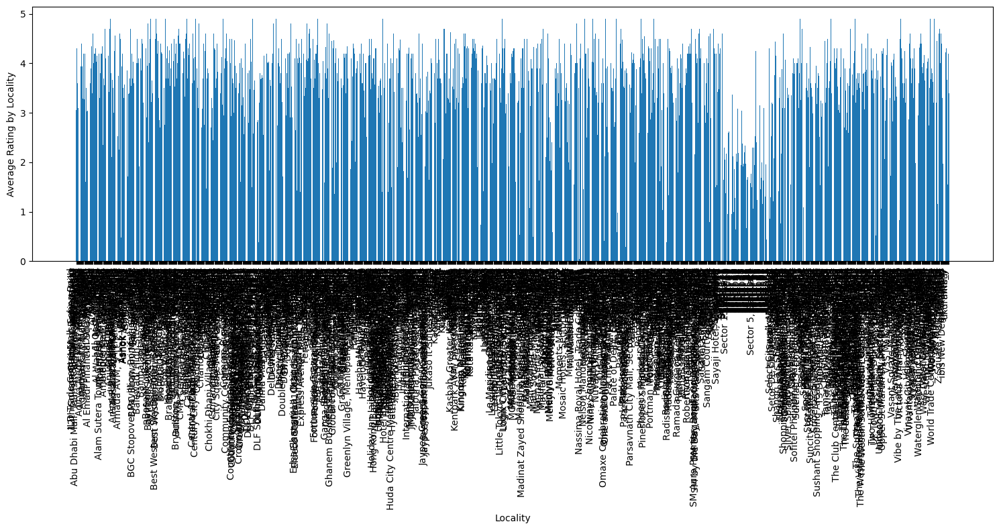

In [9]:
plt.figure(figsize=(15,8))
plt.bar(average_rating_by_city['Locality'], average_rating_by_city['Average Rating'])
plt.xlabel('Locality')
plt.ylabel('Average Rating by Locality')
plt.xticks(rotation = 90, ha = 'right')
plt.tight_layout()
plt.show()